# EDA - Vehicle Maintenance Data

### Importing Libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.subplots as sp
import plotly.graph_objects as go
import plotly.express as px
from datetime import datetime
from sklearn.model_selection import GridSearchCV, train_test_split, cross_val_score, KFold
from sklearn.linear_model import LogisticRegression 
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, precision_score, recall_score, make_scorer
from sklearn.tree import DecisionTreeClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.feature_selection import SelectKBest, f_classif
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from keras.regularizers import l2
import time
import joblib

pd.set_option('display.max_columns', None)

### Loading The Dataset

In [2]:
vmDf = pd.read_csv('data/ingestedData/vehicle_maintenance_data.csv')

### Dataset Overview

In [3]:
# Dimension of dataset
print(f"No. of Columns: {vmDf.shape[1]}")
print(f"No. of Rows: {vmDf.shape[0]}")

No. of Columns: 20
No. of Rows: 50000


In [4]:
# Dataset Description
vmDf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50000 entries, 0 to 49999
Data columns (total 20 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   vehicle_model         50000 non-null  object 
 1   mileage               50000 non-null  int64  
 2   maintenance_history   50000 non-null  object 
 3   reported_issues       50000 non-null  int64  
 4   vehicle_age           50000 non-null  int64  
 5   fuel_type             50000 non-null  object 
 6   transmission_type     50000 non-null  object 
 7   engine_size           50000 non-null  int64  
 8   odometer_reading      50000 non-null  int64  
 9   last_service_date     50000 non-null  object 
 10  warranty_expiry_date  50000 non-null  object 
 11  owner_type            50000 non-null  object 
 12  insurance_premium     50000 non-null  int64  
 13  service_history       50000 non-null  int64  
 14  accident_history      50000 non-null  int64  
 15  fuel_efficiency    

In [5]:
# Features
print("FEATURE COLUMNS:\n","\n".join(colName.title() for colName in vmDf.columns if colName!="need_maintenance"))

FEATURE COLUMNS:
 Vehicle_Model
Mileage
Maintenance_History
Reported_Issues
Vehicle_Age
Fuel_Type
Transmission_Type
Engine_Size
Odometer_Reading
Last_Service_Date
Warranty_Expiry_Date
Owner_Type
Insurance_Premium
Service_History
Accident_History
Fuel_Efficiency
Tire_Condition
Brake_Condition
Battery_Status


In [6]:
# Target Variable
print("TARGET VARIABLE:", (vmDf.columns.tolist()[-1]))

TARGET VARIABLE: need_maintenance


### Data Proprocessing

In [7]:
# Convert date columns to datetime objects
dateCols = ['last_service_date', 'warranty_expiry_date']
for col in dateCols:
    vmDf[col] = pd.to_datetime(vmDf[col], format='%d-%m-%Y')

In [8]:
# Presence of NaN values
vmDf.isnull().sum()

vehicle_model           0
mileage                 0
maintenance_history     0
reported_issues         0
vehicle_age             0
fuel_type               0
transmission_type       0
engine_size             0
odometer_reading        0
last_service_date       0
warranty_expiry_date    0
owner_type              0
insurance_premium       0
service_history         0
accident_history        0
fuel_efficiency         0
tire_condition          0
brake_condition         0
battery_status          0
need_maintenance        0
dtype: int64

In [9]:
# Presence of Duplicated Values
vmDf.duplicated().any()

False

## EDA
### Univariate Analysis

In [10]:
# Summary statistics of Numerical Variables
numeric_df = vmDf.select_dtypes(include=np.number)

for col in numeric_df.columns:
    print(f"Summary Statistics for {col}:\n{numeric_df[col].describe()}\n")

    # Create subplots
    fig = sp.make_subplots(rows=1, cols=2, subplot_titles=(f"Histogram of {col}", f"Box Plot of {col}"))

    # Histogram
    fig.add_trace(go.Histogram(x=numeric_df[col]), row=1, col=1)

    # Box plot
    fig.add_trace(go.Box(y=numeric_df[col]), row=1, col=2)

    fig.update_layout(height=600, width=1000, title_text=f"Plots for {col}", showlegend=False)
    fig.show()

Summary Statistics for mileage:
count    50000.000000
mean     54931.232680
std      14401.912925
min      30001.000000
25%      42471.500000
50%      54810.000000
75%      67391.500000
max      80000.000000
Name: mileage, dtype: float64



Summary Statistics for reported_issues:
count    50000.000000
mean         2.497420
std          1.708781
min          0.000000
25%          1.000000
50%          2.000000
75%          4.000000
max          5.000000
Name: reported_issues, dtype: float64



Summary Statistics for vehicle_age:
count    50000.000000
mean         5.492260
std          2.875682
min          1.000000
25%          3.000000
50%          5.000000
75%          8.000000
max         10.000000
Name: vehicle_age, dtype: float64



Summary Statistics for engine_size:
count    50000.000000
mean      1556.292000
std        627.677218
min        800.000000
25%       1000.000000
50%       1500.000000
75%       2000.000000
max       2500.000000
Name: engine_size, dtype: float64



Summary Statistics for odometer_reading:
count     50000.000000
mean      75551.187060
std       43088.105658
min        1001.000000
25%       38009.000000
50%       75598.500000
75%      112999.500000
max      149999.000000
Name: odometer_reading, dtype: float64



Summary Statistics for insurance_premium:
count    50000.000000
mean     17465.340700
std       7223.393401
min       5000.000000
25%      11189.750000
50%      17477.500000
75%      23692.000000
max      30000.000000
Name: insurance_premium, dtype: float64



Summary Statistics for service_history:
count    50000.000000
mean         5.515560
std          2.874899
min          1.000000
25%          3.000000
50%          6.000000
75%          8.000000
max         10.000000
Name: service_history, dtype: float64



Summary Statistics for accident_history:
count    50000.00000
mean         1.50156
std          1.11951
min          0.00000
25%          0.00000
50%          2.00000
75%          3.00000
max          3.00000
Name: accident_history, dtype: float64



Summary Statistics for fuel_efficiency:
count    50000.000000
mean        14.990323
std          2.885583
min         10.000098
25%         12.489037
50%         14.986352
75%         17.474676
max         19.999968
Name: fuel_efficiency, dtype: float64



Summary Statistics for need_maintenance:
count    50000.000000
mean         0.809960
std          0.392336
min          0.000000
25%          1.000000
50%          1.000000
75%          1.000000
max          1.000000
Name: need_maintenance, dtype: float64



##### Overview of Univariate Analysis's Findings for Numerical Variables

__Mileage and Odometer Reading:__ Most automobiles have a mileage between 42,471 and 67,391 km, with an average of 54,931 km.
Regular use and possible wear and tear are indicated by the average odometer reading of 75,551 km.

__Vehicle Age:__ At an average age of 5.5 years, vehicles are comparatively youthful.
Since the majority of cars are under eight years old, they can require less maintenance than older models.

__Issues Reported:__ Vehicles typically record 2.5 issues, with the majority reporting 1–4 issues, indicating a need for routine repair.

__Engine Size:__ A wide variety of vehicle types are represented by the average engine size of 1,556 cc, with the majority lying between 1,000 and 2,000 cc.

__Insurance Premium:__ The average insurance premium is around 17,465, indicating high expenses related to car ownership and upkeep.

__Service History:__ A dedication to routine maintenance is demonstrated by the average of 5.5 services performed on vehicles, with the majority receiving between three and eight services.

__Accident History:__ The fleet is comparatively safe, with an average of 1.5 recorded incidents and most cars having no more than three accidents.

__Fuel Efficiency:__ Most cars achieve between 12.49 and 17.47 km/l, with an average of 14.99 km/l, indicating respectable performance.

__Need Maintenance:__ It is estimated that 81% of cars require repair, highlighting the significance of preventative maintenance procedures.


__According to the dataset, the majority of cars are rather new and have moderate mileage and use. Even with routine maintenance, a sizable percentage need attention, especially in regards to reported problems and fuel economy. The findings highlight how crucial routine maintenance and observation are to guaranteeing the dependability and security of vehicles.__

#### Distribution of Categorical Variables

In [11]:
categorical_df = vmDf.select_dtypes(include=object)

for column in categorical_df.columns:
    # Value counts and percentages
    value_counts = categorical_df[column].value_counts()
    percentages = (value_counts / len(categorical_df) * 100).round(2)
    print(f"Value Counts and Percentages for {column}:\n{value_counts}\n")

    # Bar plot
    fig = px.bar(
        x=value_counts.index,
        y=value_counts.values,
        title=f"Bar Plot of {column}",
        labels={"x": column, "y": "Count"},
        text=percentages.astype(str) + "%",  # Display percentages on bars
    )
    fig.update_traces(textposition="inside")  # Position percentages outside bars
    fig.show()

Value Counts and Percentages for vehicle_model:
vehicle_model
Car           13283
Truck         11817
Bus            6605
Van            6124
Motorcycle     6104
SUV            6067
Name: count, dtype: int64



Value Counts and Percentages for maintenance_history:
maintenance_history
Poor       24343
Average    16060
Good        9597
Name: count, dtype: int64



Value Counts and Percentages for fuel_type:
fuel_type
Petrol      34255
Electric     9332
Diesel       6413
Name: count, dtype: int64



Value Counts and Percentages for transmission_type:
transmission_type
Automatic    39781
Manual       10219
Name: count, dtype: int64



Value Counts and Percentages for owner_type:
owner_type
Second    26627
First     18474
Third      4899
Name: count, dtype: int64



Value Counts and Percentages for tire_condition:
tire_condition
New         16825
Worn Out    16622
Good        16553
Name: count, dtype: int64



Value Counts and Percentages for brake_condition:
brake_condition
Worn Out    16685
New         16668
Good        16647
Name: count, dtype: int64



Value Counts and Percentages for battery_status:
battery_status
New     16725
Good    16657
Weak    16618
Name: count, dtype: int64



__Summary:__
The dataset provides a comprehensive overview of vehicle characteristics, revealing both balanced and imbalanced distributions across various features. Let's summarize the key findings:

__Vehicle Model Distribution__: The dataset includes a relatively even distribution of vehicle models, with "Car" (13283) and "Truck" (11817) being the most prevalent, suggesting a diverse representation of vehicle types.

__Maintenance History__: A significant imbalance exists in maintenance history, with "Poor" (24343) significantly outnumbering "Good" (9597) and "Average" (16060) conditions. This highlights the need for focused attention on vehicle maintenance practices.

__Fuel Type Preferences__: "Petrol" (34255) is the most common fuel type, followed by "Electric" (9332) and "Diesel" (6413), indicating a mix of traditional and modern fuel choices within the dataset.

__Transmission Type__: A near-even split is observed between "Automatic" (39781) and "Manual" (10219) transmissions, reflecting a balanced preference among vehicle owners for different transmission types.

__Owner Type Distribution__: The data shows that most vehicles are owned by second (26627) and third (4899) owners, suggesting a considerable presence of used vehicles in the dataset.

__Component Condition__: The distributions of tire, brake, and battery conditions are relatively balanced, with "New" and "Good" conditions predominating in most cases. This suggests a focus on regular component maintenance.

__Conclusion:__

The dataset offers valuable insights into the state of a diverse vehicle fleet. While certain features (like maintenance history) exhibit imbalances that require further investigation, the overall balance across various aspects suggests a representative sample of vehicles. The prevalence of "Poor" maintenance conditions suggests opportunities for improved maintenance practices or further analysis into the contributing factors. The relatively even distributions in fuel type and transmission type suggest a broad representation of vehicle preferences, while the distribution of owners suggests resale market activity may be a relevant area for further investigation. Further analysis could explore the relationship between these features and the need for maintenance.

#### CORRELATION MATRIX

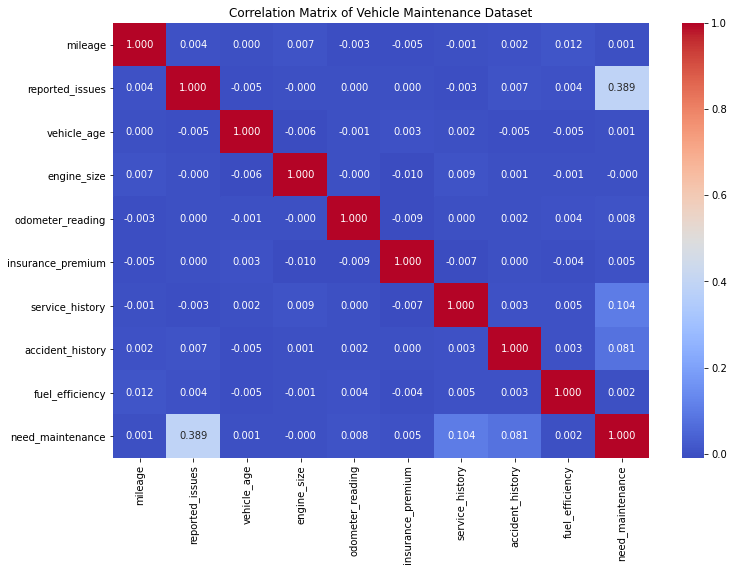

In [12]:
correlation_matrix = vmDf.corr(numeric_only=True)

# Create heatmap
plt.figure(figsize=(12, 8))  # Adjust figure size if needed
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".3f")
plt.title("Correlation Matrix of Vehicle Maintenance Dataset")
plt.show()

It is evident that __reported issues__, __service history__, __accident history__, and __odometer reading__ show a stronger correlation with the target variable __need_maintenance__ and play a more significant role in prediction compared to the other features.

#### DISTRIBUTION OF TARGET VARIABLE

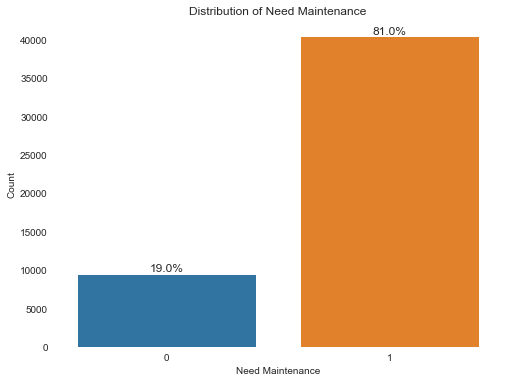

In [13]:
sns.set_style("white")

plt.figure(figsize=(8, 6))
ax = sns.countplot(x='need_maintenance', data=vmDf)

# Calculate percentages
total = len(vmDf)
for p in ax.patches:
    percentage = f"{100 * p.get_height() / total:.1f}%"
    x = p.get_x() + p.get_width() / 2
    y = p.get_height()
    ax.annotate(percentage, (x, y), ha='center', va='bottom', fontsize=12)

sns.despine(left=True, bottom=True)


plt.title('Distribution of Need Maintenance')
plt.xlabel('Need Maintenance')
plt.ylabel('Count')
plt.show()

The target feature, indicating the need for maintenance, shows a significant class imbalance, with 81% of instances requiring maintenance and only 19% not requiring it.

#### Feature Engineering

In [14]:
# Defining Dataset Generated/Created/Received Date
REFERENCE_DATE = datetime(2024, 4, 1)

# Adding New Features
# 1. Time Since Last Service (in days)
vmDf['time_since_last_service'] = (REFERENCE_DATE - vmDf['last_service_date']).dt.days

# 2. Warranty Duration (in days)
vmDf['warranty_duration'] = (vmDf['warranty_expiry_date'] - REFERENCE_DATE).dt.days

# 3. Mileage per Year
vmDf['mileage_per_year'] = vmDf['mileage'] / vmDf['vehicle_age']

# 4. Service Frequency
vmDf['service_frequency'] = vmDf['service_history'] / vmDf['vehicle_age']

# 5. Accident Rate
vmDf['accident_rate'] = vmDf['accident_history'] / vmDf['vehicle_age']

# 6. Ordinal Encoding of Maintenance History
maintenance_mapping = {'Poor': 1, 'Average': 2, 'Good': 3}
vmDf['maintenance_history'] = vmDf['maintenance_history'].map(maintenance_mapping)

# 7. Ordinal Encoding of Tire and Brake Condition
condition_mapping = {'Worn Out': 1, 'Good': 2, 'New': 3}
vmDf['tire_condition'] = vmDf['tire_condition'].map(condition_mapping)
vmDf['brake_condition'] = vmDf['brake_condition'].map(condition_mapping)

# 8. Ordinal Encoding of Battery Condition
status_mapping = {'Weak': 1, 'Good': 2, 'New': 3}
vmDf['battery_status'] = vmDf['battery_status'].map(status_mapping)

### New Correlation Matrix

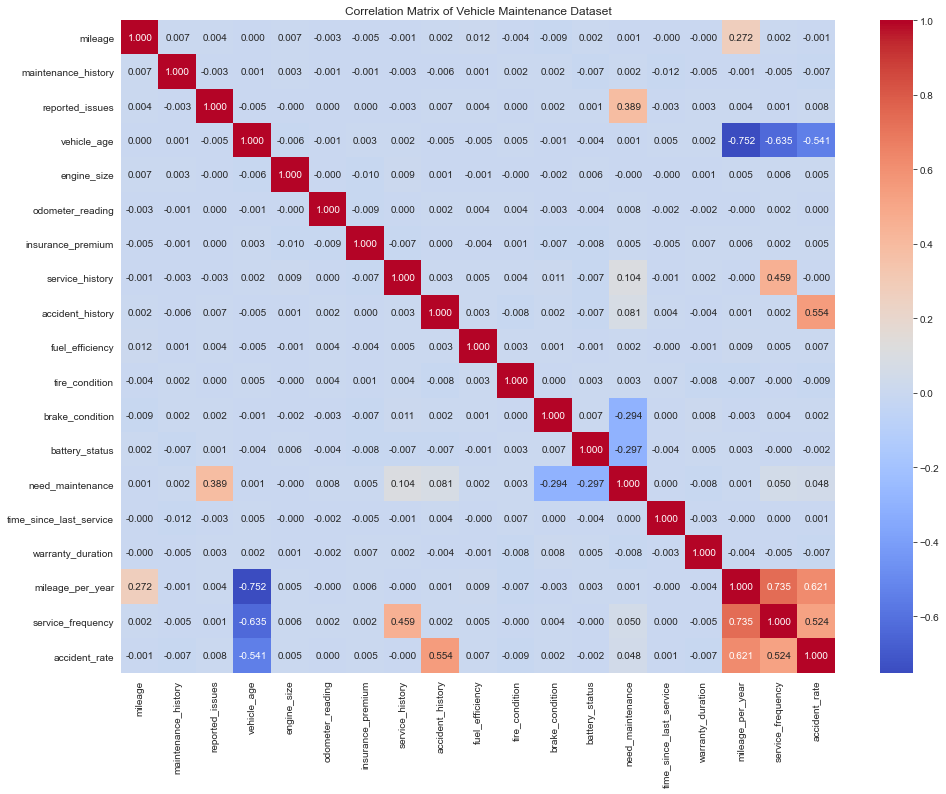

In [15]:
correlation_matrix = vmDf.corr(numeric_only=True)

# Create heatmap
plt.figure(figsize=(16, 12))  # Adjust figure size if needed
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".3f")
plt.title("Correlation Matrix of Vehicle Maintenance Dataset")
plt.show()

### Feature Scaling and Label Encoding

In [16]:
y = vmDf['need_maintenance']
X = vmDf.drop('need_maintenance', axis=1)

# # Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

In [17]:
# Identify numerical and categorical columns
numerical_cols = X.select_dtypes(include=np.number).columns
categorical_cols = X.select_dtypes(include=['category', 'object']).columns  # Ensure all categorical types are included

# Define the preprocessor
preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), numerical_cols),
        ('cat', OneHotEncoder(handle_unknown='ignore', sparse_output=False), categorical_cols)
    ]
)

# Fit the preprocessor and transform the training and test sets
X_train_processed = preprocessor.fit_transform(X_train)
X_test_processed = preprocessor.transform(X_test)

# Retrieve the combined feature names from the ColumnTransformer
feature_names = preprocessor.get_feature_names_out()

# Convert the processed arrays back to pandas DataFrames with the feature names
X_train = pd.DataFrame(X_train_processed, columns=feature_names)
X_test = pd.DataFrame(X_test_processed, columns=feature_names)


### MODEL TRAINING

#### Model1: LogisticRegression

In [18]:
# Initializing the model
model = LogisticRegression()
model.fit(X_train, y_train)

# Making predictions with the normalized test set
y_pred = model.predict(X_test)

# Evaluating the model
accuracy_LR = accuracy_score(y_test, y_pred)
class_report = classification_report(y_test, y_pred, output_dict=True)

print("\nAccuracy of LR Classifier on test set:", accuracy_LR)
print(f"\nPrecision: {class_report['weighted avg']['precision']}")
print(f"\nRecall: {class_report['weighted avg']['recall']}")
print(f"\nf1_score: {class_report['weighted avg']['f1-score']}")


Accuracy of LR Classifier on test set: 0.88272

Precision: 0.8766411716953555

Recall: 0.88272

f1_score: 0.8779490936991672


__From the main code, the Decision Tree Classifier emerged as the best-performing model. We will begin our analysis with the Decision Tree Classifier and then explore other models to identify potential improvements.__

In [19]:
# 1. Simple Decision Tree
dt_model_simple = DecisionTreeClassifier()
dt_model_simple.fit(X_train, y_train)
y_pred_simple = dt_model_simple.predict(X_test)
accuracy_simple = accuracy_score(y_test, y_pred_simple)
print(f"Simple DT Accuracy: {accuracy_simple}")

Simple DT Accuracy: 0.93936


In [20]:
# 2. Hyperparameter Tuning for Decision Tree
param_grid_dt = {
    'max_depth': [None, 5, 10, 15],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'criterion': ['gini', 'entropy', 'log_loss']
}
dt_model = DecisionTreeClassifier()
grid_search_dt = GridSearchCV(dt_model, param_grid_dt, cv=5, scoring='accuracy', n_jobs=-1)
grid_search_dt.fit(X_train, y_train)

best_dt_model = grid_search_dt.best_estimator_
y_pred_tuned = best_dt_model.predict(X_test)
accuracy_tuned = accuracy_score(y_test, y_pred_tuned)
print(f"\nTuned DT Accuracy: {accuracy_tuned}")
print(f"Best DT parameters: {grid_search_dt.best_params_}")


Tuned DT Accuracy: 0.95816
Best DT parameters: {'criterion': 'gini', 'max_depth': 5, 'min_samples_leaf': 1, 'min_samples_split': 2}


In [21]:
print(f"Accuracy improvement: {accuracy_tuned - accuracy_simple}")

Accuracy improvement: 0.01880000000000004


__Next, we will proceed with Neural Networks to further our exploration.__

In [22]:
# Define the model
model = Sequential([
    Dense(64, input_dim=X_train.shape[1], activation='relu'),  
    Dense(32, activation='relu'),                
    Dense(8, activation='relu'),               
    Dense(1, activation='sigmoid')             
])

In [23]:
# Compile the model
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

# Print model summary to get the number of parameters
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 64)                2112      
                                                                 
 dense_1 (Dense)             (None, 32)                2080      
                                                                 
 dense_2 (Dense)             (None, 8)                 264       
                                                                 
 dense_3 (Dense)             (None, 1)                 9         
                                                                 
Total params: 4465 (17.44 KB)
Trainable params: 4465 (17.44 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [24]:
# Fit the model on the training data
history = model.fit(X_train, y_train, epochs=150, batch_size=10, validation_split=0.25, verbose=1)

Epoch 1/150
2813/2813 [==============================] - 4s 1ms/step - loss: 0.1729 - accuracy: 0.9232 - val_loss: 0.1215 - val_accuracy: 0.9414
Epoch 2/150
2813/2813 [==============================] - 3s 1ms/step - loss: 0.1110 - accuracy: 0.9480 - val_loss: 0.1098 - val_accuracy: 0.9483
Epoch 3/150
2813/2813 [==============================] - 3s 1ms/step - loss: 0.1014 - accuracy: 0.9513 - val_loss: 0.1105 - val_accuracy: 0.9467
Epoch 4/150
2813/2813 [==============================] - 3s 997us/step - loss: 0.0924 - accuracy: 0.9526 - val_loss: 0.0973 - val_accuracy: 0.9531
Epoch 5/150
2813/2813 [==============================] - 3s 998us/step - loss: 0.0853 - accuracy: 0.9565 - val_loss: 0.0940 - val_accuracy: 0.9536
Epoch 6/150
2813/2813 [==============================] - 3s 1ms/step - loss: 0.0801 - accuracy: 0.9593 - val_loss: 0.0920 - val_accuracy: 0.9533
Epoch 7/150
2813/2813 [==============================] - 3s 998us/step - loss: 0.0779 - accuracy: 0.9591 - val_loss: 0.0912 - 

In [25]:
# Evaluate the model on the test set
loss, accuracy = model.evaluate(X_test, y_test)
print(f"Test Accuracy: {accuracy * 100:.2f}%")

# Predicting using the test set
predictions = model.predict(X_test)
predictions = (predictions > 0.5).astype(int)

# Analysis
print(classification_report(y_test, predictions))
print(confusion_matrix(y_test, predictions))

391/391 [==============================] - 0s 706us/step - loss: 0.6013 - accuracy: 0.9458
Test Accuracy: 94.58%
391/391 [==============================] - 0s 602us/step
              precision    recall  f1-score   support

           0       0.85      0.87      0.86      2406
           1       0.97      0.96      0.97     10094

    accuracy                           0.95     12500
   macro avg       0.91      0.92      0.91     12500
weighted avg       0.95      0.95      0.95     12500

[[2083  323]
 [ 355 9739]]


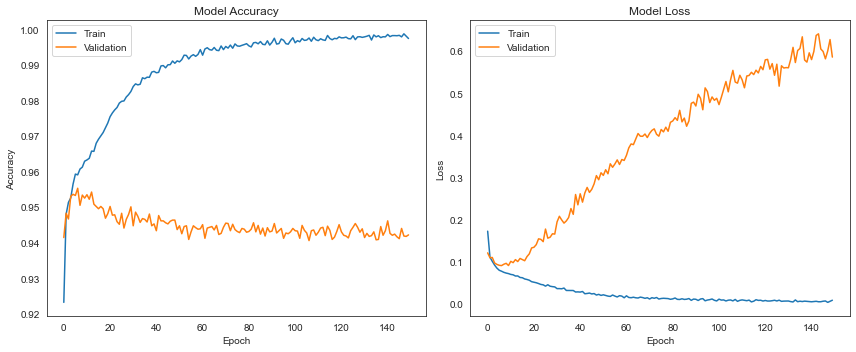

In [26]:
# Plot training & validation accuracy values
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

# Plot training & validation loss values
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

plt.tight_layout()
plt.show()

From the training and validation performance plots, it is evident that the model is overfitting. The training accuracy steadily increases and approaches 1.0, while the validation accuracy remains significantly lower and stagnant, indicating poor generalization to unseen data. Similarly, the training loss continues to decrease, whereas the validation loss starts to increase after a certain number of epochs. This behavior highlights that the model is overly tuned to the training data, compromising its ability to perform well on the validation set.

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_4 (Dense)             (None, 64)                2112      
                                                                 
 dropout (Dropout)           (None, 64)                0         
                                                                 
 dense_5 (Dense)             (None, 32)                2080      
                                                                 
 dropout_1 (Dropout)         (None, 32)                0         
                                                                 
 dense_6 (Dense)             (None, 8)                 264       
                                                                 
 dense_7 (Dense)             (None, 1)                 9         
                                                                 
Total params: 4465 (17.44 KB)
Trainable params: 4465 (

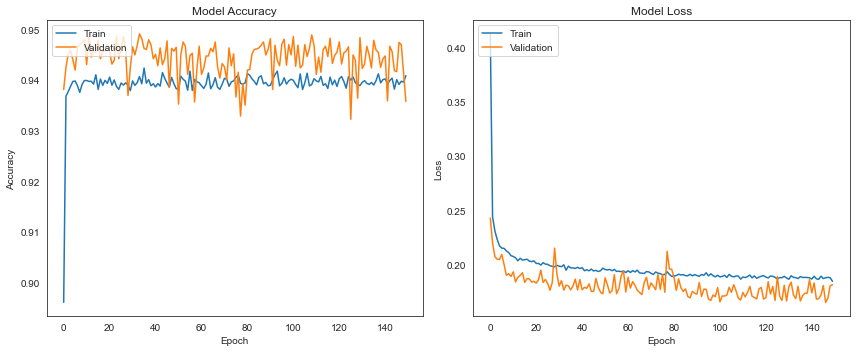

In [27]:
model_tuned = Sequential([
    Dense(64, input_dim=X_train.shape[1], activation='relu', kernel_regularizer=l2(0.01)),  # L2 regularization
    Dropout(0.3),                                     # Dropout layer with 30% dropout rate
    Dense(32, activation='relu', kernel_regularizer=l2(0.01)),  # Hidden layer with L2 regularization
    Dropout(0.3),                                     # Dropout layer with 30% dropout rate
    Dense(8, activation='relu', kernel_regularizer=l2(0.01)),   # Hidden layer with L2 regularization
    Dense(1, activation='sigmoid')                   # Output layer with sigmoid for binary classification
])

# Compile the model
model_tuned.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

# Print model summary to get the number of parameters
model_tuned.summary()

# Fit the model on the training data
history_tuned = model_tuned.fit(X_train, y_train, epochs=150, batch_size=10, validation_split=0.25, verbose=1)

# Evaluate the model on the test set
loss, accuracy = model_tuned.evaluate(X_test, y_test)
print(f"Test Accuracy: {accuracy * 100:.2f}%")

# Predicting using the test set
predictions = model_tuned.predict(X_test)
predictions = (predictions > 0.5).astype(int)

# Analysis
print(classification_report(y_test, predictions))
print(confusion_matrix(y_test, predictions))

# Plot training & validation accuracy values
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(history_tuned.history['accuracy'])
plt.plot(history_tuned.history['val_accuracy'])
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

# Plot training & validation loss values
plt.subplot(1, 2, 2)
plt.plot(history_tuned.history['loss'])
plt.plot(history_tuned.history['val_loss'])
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

plt.tight_layout()
plt.show()

##### Observation on Model Adjustment and Overfitting Reduction:
The large difference between training and validation accuracy and the growing validation loss were indicators of overfitting in the original model. Several changes were performed, such as adding L2 regularization and Dropout layers, to address this problem and enhance the model's generalization.

__The tuned model was structured as follows:__

1. Each Dense layer was subjected to L2 Regularization, which penalizes high weights and keeps the model from depending too much on any one feature. The regularization strength was set at 0.01 to minimize overfitting.

2. Following each Dense layer, dropout layers with a 30% dropout rate were used to randomly remove neurons during training. This improves model generalization by lowering neuronal co-adaptation.

3. In order to allow the model to learn from the data while verifying its performance on a hold-out set, it was trained for 150 epochs with a batch size of 10 and a validation split of 25%.

4. The model's performance was tracked throughout training by keeping an eye on the assessment measures, such as accuracy and loss. When compared to the prior model, the model's test accuracy improved, and its training/validation loss curves revealed a more stable and reduced validation loss.

##### These adjustments greatly improved generalization to previously unknown data by lowering the overfitting that was previously noted. The classification report and confusion matrix were also used to assess the model's performance on the test set, offering further information about how well the model predicted outcomes.

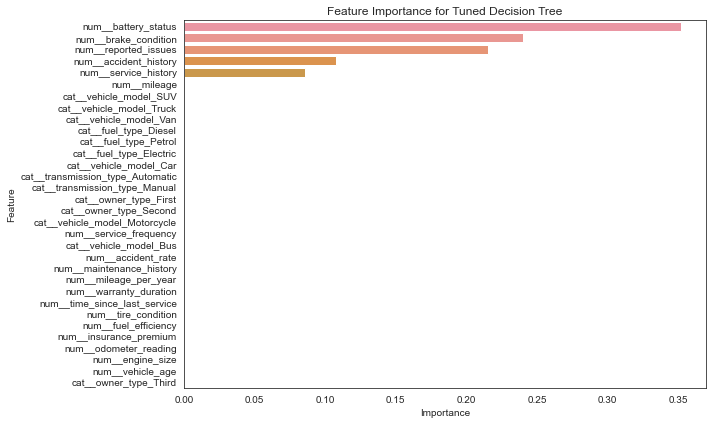

In [28]:
# Function to plot feature importance
def plot_feature_importance(model, X_train, title):
    feature_importances = model.feature_importances_
    feature_importance_df = pd.DataFrame({'feature': X_train.columns, 'importance': feature_importances})
    feature_importance_df = feature_importance_df.sort_values(by='importance', ascending=False)
    plt.figure(figsize=(10, 6))
    sns.barplot(x='importance', y='feature', data=feature_importance_df)
    plt.title(f'Feature Importance for {title}')
    plt.xlabel('Importance')
    plt.ylabel('Feature')
    plt.tight_layout()
    plt.show()



# Feature Importance: Decision Tree
plot_feature_importance(best_dt_model, X_train, 'Tuned Decision Tree')

In [29]:
# Select top 5 features
selector = SelectKBest(f_classif, k=5)
X_train_selected = selector.fit_transform(X_train, y_train)
X_test_selected = selector.transform(X_test)
selected_features = X_train.columns[selector.get_support()]
selected_features

Index(['num__reported_issues', 'num__service_history', 'num__accident_history',
       'num__brake_condition', 'num__battery_status'],
      dtype='object')

In [30]:
# Train DT with selected features
best_dt_model_selected = DecisionTreeClassifier(**grid_search_dt.best_params_)
best_dt_model_selected.fit(X_train_selected, y_train)
y_pred_selected = best_dt_model_selected.predict(X_test_selected)
accuracy_selected = accuracy_score(y_test, y_pred_selected)
print(f"\nAccuracy with top 5 features: {accuracy_selected}")
print(f"Selected features: {selected_features}")


Accuracy with top 5 features: 0.95816
Selected features: Index(['num__reported_issues', 'num__service_history', 'num__accident_history',
       'num__brake_condition', 'num__battery_status'],
      dtype='object')


### MODEL EVALUATION

In [31]:
# Function to plot confusion matrix
def plot_confusion_matrix(y_true, y_pred, model_name):
    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=['Predicted 0', 'Predicted 1'],
                yticklabels=['Actual 0', 'Actual 1'])
    plt.title(f'Confusion Matrix for {model_name}')
    plt.xlabel('Predicted Label')
    plt.ylabel('Actual Label')
    plt.show()

In [32]:
# Model Evaluation: Choose best model (Example: based on accuracy)
best_model = best_dt_model if accuracy_tuned > accuracy else model_tuned
print(f"\nBest model selected: {best_model}")


Best model selected: DecisionTreeClassifier(max_depth=5)



Classification Report:
               precision    recall  f1-score   support

           0       0.90      0.88      0.89      2406
           1       0.97      0.98      0.97     10094

    accuracy                           0.96     12500
   macro avg       0.93      0.93      0.93     12500
weighted avg       0.96      0.96      0.96     12500



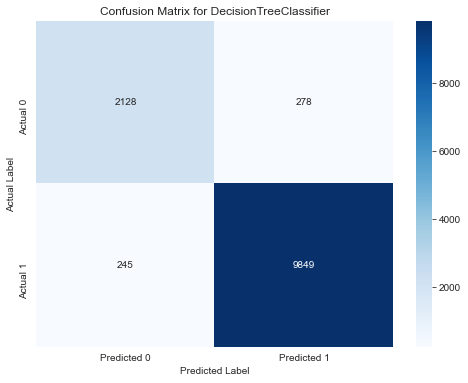

In [33]:
# Model Prediction and Confusion Matrix
y_pred_best = best_model.predict(X_test)
print(f"\nClassification Report:\n {classification_report(y_test, y_pred_best)}")
plot_confusion_matrix(y_test, y_pred_best, best_model.__class__.__name__)

#### Thus, the Decision Tree Classifier, with a test accuracy of 96%, outperforms all other models, making it the best choice for this dataset.